Be sure to change runtime type to GPU if on Google Colab

In [2]:
import math
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import os

In [1]:
from google.colab import drive
drive.mount('content/')

Mounted at content/


In [3]:
from keras.preprocessing import image
test_image = image.load_img('/content/content/MyDrive/AI & Deep Learning Project/images_multiclass/test/cardboard/cardboard102.jpg')
img_array = image.img_to_array(test_image)

In [4]:
img_array.shape

(384, 512, 3)

In [5]:
n_classes = len(os.listdir('/content/content/MyDrive/AI & Deep Learning Project/images_multiclass'))
n_classes

2

In [6]:
img_array = image.img_to_array(test_image)
keras.applications.xception.preprocess_input(img_array).shape

(384, 512, 3)

In [7]:
TEST_PATH = '/content/content/MyDrive/AI & Deep Learning Project/images_multiclass/test'
TRAIN_PATH = '/content/content/MyDrive/AI & Deep Learning Project/images_multiclass/train'

X_valid_list = []
y_valid_list = []

X_train_list = []
y_train_list = []

for folder in os.listdir(TEST_PATH):
  FOLDER_PATH = os.path.join(TEST_PATH, folder)
  for im in os.listdir(FOLDER_PATH):
    img = image.load_img(os.path.join(TEST_PATH, folder, im), target_size=(224, 224))
    img_array = image.img_to_array(img)
    processed_img = keras.applications.xception.preprocess_input(img_array)
    X_valid_list.append(list(processed_img))
    y_valid_list += [folder] # label of the image being passed in
    if len(y_valid_list)%50 == 0:
      print(len(y_valid_list), 'images loaded into test')

for folder in os.listdir(TRAIN_PATH):
  FOLDER_PATH = os.path.join(TRAIN_PATH, folder)
  for im in os.listdir(FOLDER_PATH):
    img = image.load_img(os.path.join(TRAIN_PATH, folder, im), target_size=(224, 224))
    img_array = image.img_to_array(img)
    processed_img = keras.applications.xception.preprocess_input(img_array)
    X_train_list.append(list(processed_img))
    y_train_list += [folder] # label of the image being passed in
    if len(y_train_list)%50 == 0:
      print(len(y_train_list), 'images loaded into train')

50 images loaded into test
100 images loaded into test
150 images loaded into test
200 images loaded into test
250 images loaded into test
300 images loaded into test
350 images loaded into test
400 images loaded into test
450 images loaded into test
500 images loaded into test
50 images loaded into train
100 images loaded into train
150 images loaded into train
200 images loaded into train
250 images loaded into train
300 images loaded into train
350 images loaded into train
400 images loaded into train
450 images loaded into train
500 images loaded into train
550 images loaded into train
600 images loaded into train
650 images loaded into train
700 images loaded into train
750 images loaded into train
800 images loaded into train
850 images loaded into train
900 images loaded into train
950 images loaded into train
1000 images loaded into train
1050 images loaded into train
1100 images loaded into train
1150 images loaded into train
1200 images loaded into train
1250 images loaded in

# EDA <br>
For this section, we will do an exploratory data analysis for the different images available. First, let's look at the amount of images per category. Also, let's take a closer look at each category.

In [84]:
# Import libraries for EDA

import seaborn as sb
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Setting default fig size
size_ = (10,8)

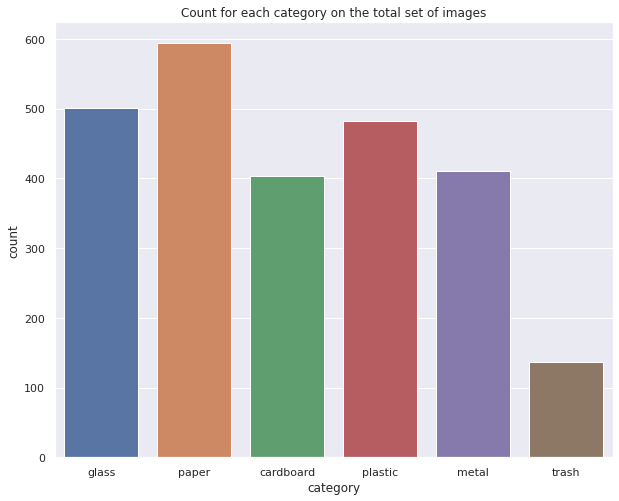

In [81]:
category = []
filename = []

with open('/content/content/MyDrive/AI & Deep Learning Project/images_multiclass/one-indexed-files.txt', 'r') as file:
    for line in file:     
        cat = ''.join([i for i in line.split('.')[0] if not i.isdigit()])
        category.append(cat)
        filename.append(cat+"/"+line.split(' ')[0])
df = pd.DataFrame({
    'filename':filename,
    'category': category,
})

fig = plt.subplots(figsize=size_)
plt.title('Count for each category on the total set of images')
sb.countplot(x = df['category'], data=df)

In [8]:
# Train set

labels = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

for label in labels:
    directory = os.path.join(TRAIN_PATH, label)
    print("Images of label \"" + label + "\":\t", len(os.listdir(directory)))

Images of label "cardboard":	 317
Images of label "glass":	 393
Images of label "metal":	 328
Images of label "paper":	 476
Images of label "plastic":	 384
Images of label "trash":	 111


In [24]:
# Test set

for label in labels:
    directory = os.path.join(TEST_PATH, label)
    print("Images of label \"" + label + "\":\t", len(os.listdir(directory)))

Images of label "cardboard":	 86
Images of label "glass":	 108
Images of label "metal":	 82
Images of label "paper":	 118
Images of label "plastic":	 98
Images of label "trash":	 26


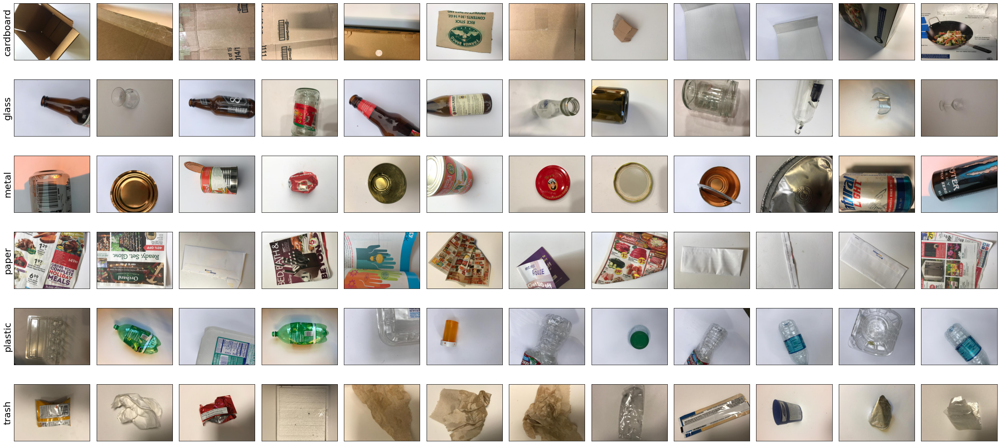

In [29]:
# Image visualization

plt.figure(figsize=(30,14))

for i in range(6):
    directory = os.path.join(TRAIN_PATH, labels[i])
    for j in range(12):
        path = os.path.join(directory, os.listdir(directory)[j])
        img = mpimg.imread(path)
        
        plt.subplot(6, 12, i*12 + j + 1)
        plt.imshow(img)
        
        if j == 0:
            plt.ylabel(labels[i], fontsize=20)
        
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[]);
plt.tight_layout()
plt.show()

# Data split

In [39]:
X_valid = np.array(X_valid_list).astype(np.float32)
X_train_full = np.array(X_train_list).astype(np.float32)
y_valid = pd.factorize(y_valid_list)[0].reshape(-1, 1).astype(np.float32)
y_train_full = pd.factorize(y_train_list)[0].reshape(-1, 1).astype(np.float32)

In [40]:
valid_shuffler = np.random.permutation(len(X_valid))
X_valid = X_valid[valid_shuffler]
y_valid = y_valid[valid_shuffler]

train_full_shuffler = np.random.permutation(len(X_train_full))
X_train_full = X_train_full[train_full_shuffler]
y_train_full = y_train_full[train_full_shuffler]

In [41]:
test_size = int(len(y_valid)/2)
X_train, X_test = X_train_full[:-test_size], X_train_full[-test_size:]
y_train, y_test = y_train_full[:-test_size], y_train_full[-test_size:]

In [42]:
base_model = keras.applications.xception.Xception(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

83689472/83683744 [==============================] - 1s 0us/step


In [43]:
base_model.trainable = False

model = keras.models.Sequential()
model.add(base_model)
model.add(keras.layers.GlobalAveragePooling2D())
model.add(keras.layers.Dense(256, activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dropout(0.2))
model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(6, activation='softmax')) # prediction layer

In [44]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Functional)        (None, 7, 7, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
batch_normalization_4 (Batch (None, 256)               1024      
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
flatten (Flatten)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 1

In [45]:
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [46]:
# implementing a custom callback to stop training if we reach accuracy >0.999 because that indicates overfitting on this relatively small dataset
class OverfittingCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if logs.get('accuracy') > 0.999:
      self.model.stop_training = True
      print('Trying to prevent overfitting - stopping training')

In [47]:
#TensorBoard
root_logdir = os.path.join(os.curdir, 'my_logs')

def get_run_logdir():
  import time
  run_id = time.strftime('run_%Y_%m_%d-%H_%M_%S')
  return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()

tensorboard_callback = keras.callbacks.TensorBoard(run_logdir, update_freq="epoch")

In [48]:
history = model.fit(X_train, y_train, epochs=40, validation_data = (X_valid, y_valid), callbacks = [keras.callbacks.EarlyStopping(patience=3, monitor='val_accuracy'), OverfittingCallback(), tensorboard_callback])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/40
55/55 [==============================] - 44s 214ms/step - loss: 0.7706 - accuracy: 0.7440 - val_loss: 4.3697 - val_accuracy: 0.0193
Epoch 2/40
55/55 [==============================] - 9s 160ms/step - loss: 0.2795 - accuracy: 0.9000 - val_loss: 5.0965 - val_accuracy: 0.0174
Epoch 3/40
55/55 [==============================] - 9s 161ms/step - loss: 0.1882 - accuracy: 0.9411 - val_loss: 5.5883 - val_accuracy: 0.0251
Epoch 4/40
55/55 [==============================] - 9s 164ms/step - loss: 0.1261 - accuracy: 0.9571 - val_loss: 6.3322 - val_accuracy: 0.0174
Epoch 5/40
55/55 [==============================] - 9s 167ms/step - loss: 0.0777 - accuracy: 0.9840 - val_loss: 6.7146 - val_accuracy: 0.0212
Epoch 6/40
55/55 [==============================] - 9s 169ms/step - loss: 0.0486 - accuracy: 0.9926 - val_loss: 7.4782 - val_accuracy: 0.0251


In [49]:
base_model.trainable = True
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Functional)        (None, 7, 7, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
batch_normalization_4 (Batch (None, 256)               1024      
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
flatten (Flatten)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 1

In [50]:
history = model.fit(X_train, y_train, epochs=40, validation_data=(X_valid, y_valid), callbacks=[keras.callbacks.EarlyStopping(patience=3, monitor='val_accuracy'), OverfittingCallback()])

Epoch 1/40
55/55 [==============================] - 10s 175ms/step - loss: 0.0480 - accuracy: 0.9903 - val_loss: 8.0573 - val_accuracy: 0.0309
Epoch 2/40
55/55 [==============================] - 10s 180ms/step - loss: 0.0307 - accuracy: 0.9954 - val_loss: 8.1207 - val_accuracy: 0.0174
Epoch 3/40
55/55 [==============================] - 10s 185ms/step - loss: 0.0360 - accuracy: 0.9943 - val_loss: 8.6069 - val_accuracy: 0.0154
Epoch 4/40
55/55 [==============================] - 10s 185ms/step - loss: 0.0250 - accuracy: 0.9960 - val_loss: 8.9634 - val_accuracy: 0.0212


In [51]:
%load_ext tensorboard
%tensorboard --logdir=./my_logs --port=6006

<IPython.core.display.Javascript object>

In [52]:
incorrect = dict()
for idx, predictions in enumerate(model.predict(X_test)):
  if np.argmax(predictions) != y_test[idx][0]:
    incorrect[idx] = {'Predicted': np.argmax(predictions), 'Actual': y_test[idx][0]}

incorrect_preds = pd.DataFrame.from_dict(incorrect, orient='index')

In [53]:
incorrect_preds.reset_index()

,index,Predicted,Actual
0,2,4,5.0
1,4,0,2.0
2,31,4,5.0
3,44,5,4.0
4,46,2,5.0
5,50,3,4.0
6,56,2,5.0
7,58,0,3.0
8,66,4,0.0
9,67,0,1.0


# Visualizing results

In [59]:
predicted_class=model.predict_classes(X_test)
predicted_class

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:455: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


array([0, 3, 4, 1, 0, 2, 3, 4, 5, 3, 3, 2, 5, 3, 4, 1, 2, 1, 4, 5, 3, 5,
       3, 5, 4, 1, 3, 2, 1, 1, 2, 4, 1, 4, 4, 2, 2, 3, 1, 4, 3, 0, 4, 1,
       5, 1, 2, 3, 2, 1, 3, 4, 2, 2, 5, 1, 2, 3, 0, 3, 4, 1, 4, 1, 2, 3,
       4, 0, 1, 1, 3, 2, 3, 4, 3, 5, 0, 4, 5, 2, 2, 2, 3, 0, 2, 3, 3, 1,
       2, 2, 4, 3, 3, 1, 3, 3, 5, 3, 5, 1, 4, 5, 5, 3, 3, 3, 2, 5, 0, 5,
       4, 5, 5, 2, 2, 5, 5, 3, 1, 3, 2, 0, 2, 2, 0, 0, 1, 0, 5, 1, 4, 4,
       4, 0, 1, 5, 3, 4, 2, 1, 2, 5, 2, 4, 1, 0, 2, 3, 3, 1, 5, 2, 3, 4,
       2, 1, 1, 2, 5, 5, 2, 1, 4, 5, 1, 4, 5, 3, 2, 5, 3, 1, 3, 5, 4, 0,
       2, 4, 2, 2, 5, 3, 4, 1, 3, 3, 5, 4, 3, 4, 2, 3, 4, 4, 0, 1, 0, 3,
       2, 3, 3, 2, 1, 3, 3, 1, 3, 5, 5, 4, 1, 3, 2, 2, 3, 1, 4, 1, 1, 3,
       5, 3, 3, 2, 3, 2, 3, 4, 5, 4, 3, 5, 2, 3, 1, 4, 2, 5, 1, 4, 3, 2,
       1, 4, 0, 1, 3, 1, 4, 4, 3, 3, 3, 1, 2, 2, 3, 2, 3])

In [55]:
def class_convert(classess):
    pred=[]
    for i in classess:
        if i ==0:
            pred.append('Cardboard')
        elif i==1:
            pred.append('Glass')
        elif i==2:
            pred.append('Metal')
        elif i==3:
            pred.append('Paper')
        elif i==4:
            pred.append('Plastic')
        elif i==5:
            pred.append('Trash')
    return pred

In [56]:
pred_class=class_convert(predicted_class)
y_class=class_convert(y_test)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

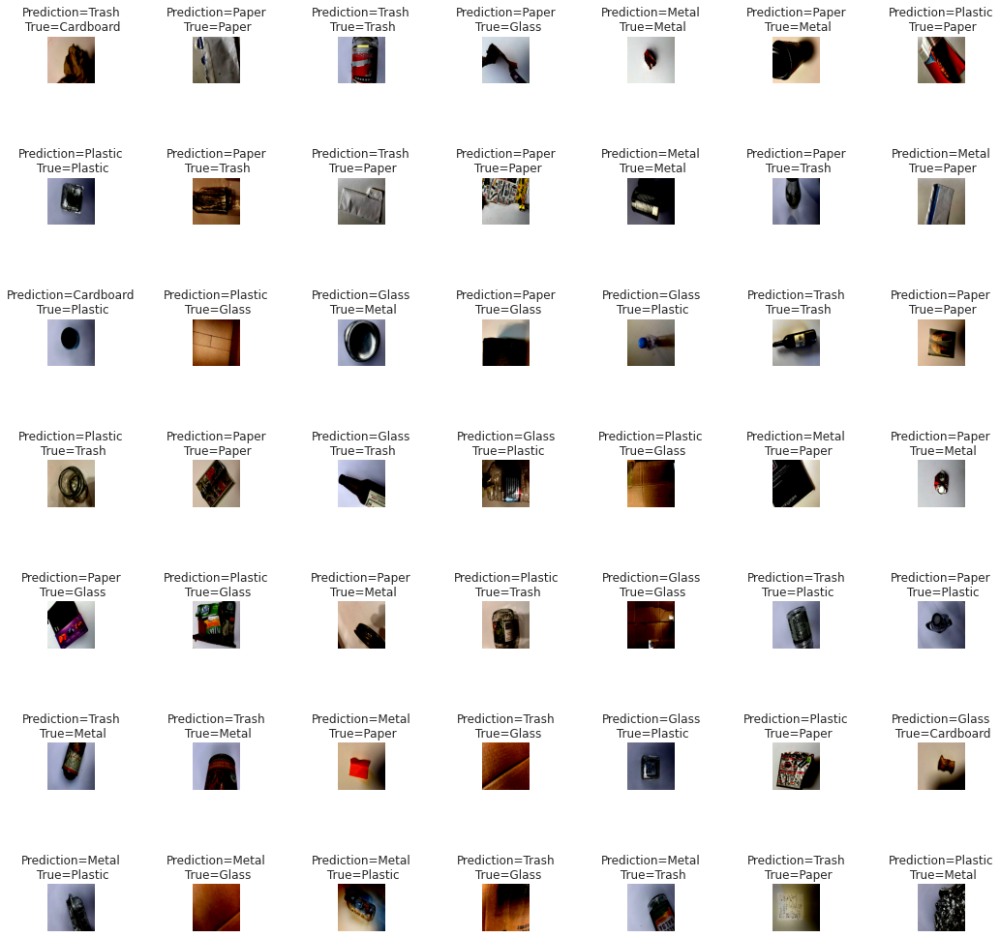

In [86]:
L=7
W=7
fig,axes=plt.subplots(L,W,figsize=(17,17))
axes=axes.ravel()

for i in np.arange(0,L*W):
    axes[i].imshow(X_test[i])
    axes[i].set_title('Prediction={}\n True={}'.format(pred_class[i],y_class[i]))
    axes[i].axis('off')

plt.subplots_adjust(wspace=2,hspace=2)

In [75]:
corr=0
false=0
for i in range(len(y_test)):
    if y_test[i]==predicted_class[i]:
         corr=corr+1
    else:
        false=false+1
        
print("Correct:",corr)
print("False",false)

Correct: 212
False 47


In [61]:
from sklearn.metrics import confusion_matrix

cm=confusion_matrix(y_test,predicted_class)
cm

array([[ 9,  0,  1,  1,  1,  0],
       [ 1, 44,  0,  6,  0,  0],
       [ 3,  0, 42,  2,  2,  3],
       [ 1,  1,  3, 54,  1,  1],
       [ 4,  0,  2,  2, 34,  4],
       [ 0,  0,  3,  0,  5, 29]])

In [78]:
cm.shape

(6, 6)

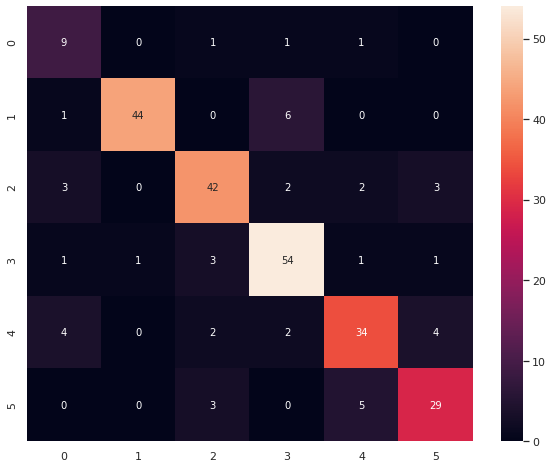

In [79]:
df_cm = pd.DataFrame(cm, range(cm.shape[0]), range(cm.shape[1]))
fig = plt.subplots(figsize=size_)
sb.set(font_scale=1)
sb.heatmap(df_cm, annot=True, annot_kws={"size": 10}) # font size
plt.show()